In [2]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from tensorflow.keras.optimizers import RMSprop
import tensorflow as tf
import cv2
import os
from tensorflow.keras import datasets, layers, models
import matplotlib.pyplot as plt
import numpy as np

In [3]:
IMAGE_SIZE = 224
BATCH_SIZE = 32

In [4]:
img = image.load_img(r"C:\Users\ADIL SHAIKH\Downloads\Train\1.jpg")

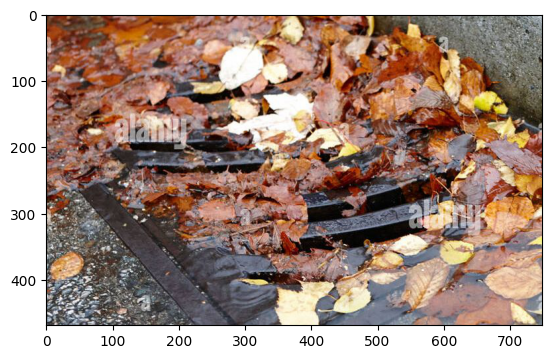

In [5]:
plt.imshow(img)

In [6]:
cv2.imread(r"C:\Users\ADIL SHAIKH\Downloads\Train\1.jpg").shape

(469, 749, 3)

In [ ]:
469 - pixels hight 
749 - pixels width
3 - 3 metrix dimention (color)

In [7]:
train = ImageDataGenerator(rescale = 1/255)

validation = ImageDataGenerator(rescale = 1/255)

In [8]:
train_datasets = train.flow_from_directory(r"C:\Users\ADIL SHAIKH\OneDrive\Desktop\BLOCKAGE\basedata\training",
                                           target_size = (224,224),
                                           batch_size = 32 ,
                                          class_mode = 'binary')

validation_datasets = validation.flow_from_directory(r"C:\Users\ADIL SHAIKH\OneDrive\Desktop\BLOCKAGE\basedata\validation",
                                           target_size = (224,224),
                                           batch_size = 32 ,
                                          class_mode = 'binary')

Found 23 images belonging to 2 classes.
Found 23 images belonging to 2 classes.


In [9]:
train_datasets.class_indices

{'FULL BLOCKAGE': 0, 'NO BLOCKAGE': 1}

In [10]:
train_datasets.classes

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1])

# neural network cant support string types as prediction

# it convort all the classes inside into numerical value

# HENCE WE HV DEFINE OUR TRAINING AND VALIDATION DATASETS

# NOW WE GOING TO DEFINE OUR MODEL :- CNN

# Convolutional Neural Network (CNN)

In [12]:
# Define the CNN architecture

model = tf.keras.models.Sequential([ tf.keras.layers.Conv2D(16, (3,3), activation = 'relu', input_shape = (224,224,32)),
                                    tf.keras.layers.MaxPool2D(2,2), 
                                    #
                                    tf.keras.layers.Conv2D(32, (3,3), activation = 'relu'), 
                                    tf.keras.layers.MaxPool2D(2,2),
                                    #
                                    tf.keras.layers.Conv2D(64, (3,3), activation = 'relu'),
                                    tf.keras.layers.MaxPool2D(2,2),
                                    ##
                                    tf.keras.layers.Flatten(),
                                    ##
                                    tf.keras.layers.Dense(512,activation= 'relu'),
                                    ##
                                    tf.keras.layers.Dense(1,activation='sigmoid')
                                    ])

In [13]:
# Define the CNN architecture
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(32, 32, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))

In [14]:
model.compile(loss= 'binary_crossentropy',
             optimizer = RMSprop(learning_rate=0.001),
             metrics =['accuracy'])

# LET SEE ALL THE IMAGES OF  BLOCKAGE FOR TESTING

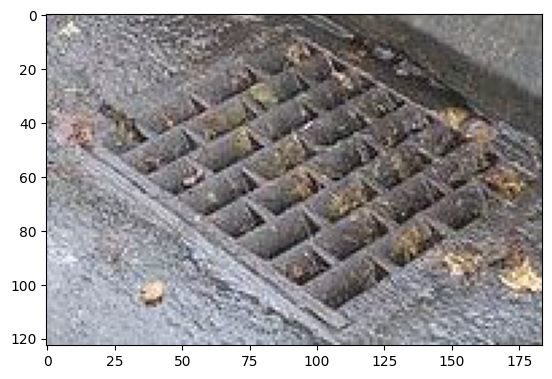

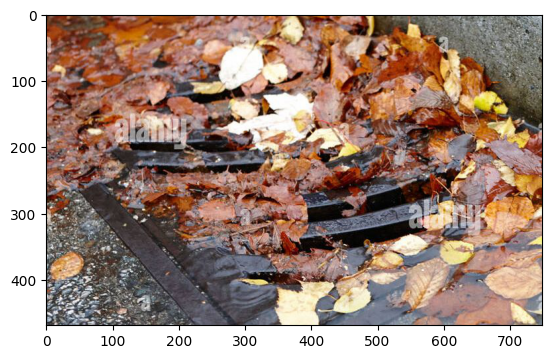

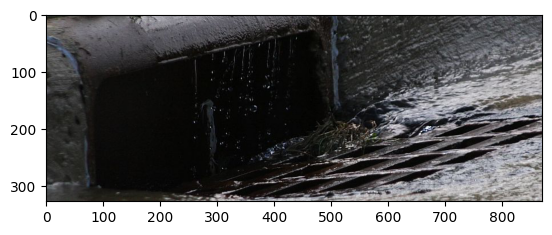

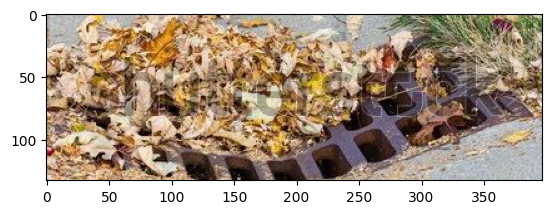

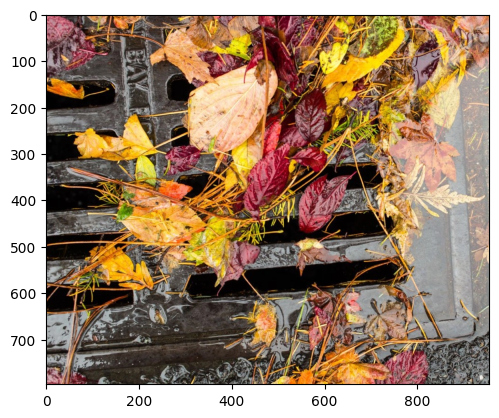

...

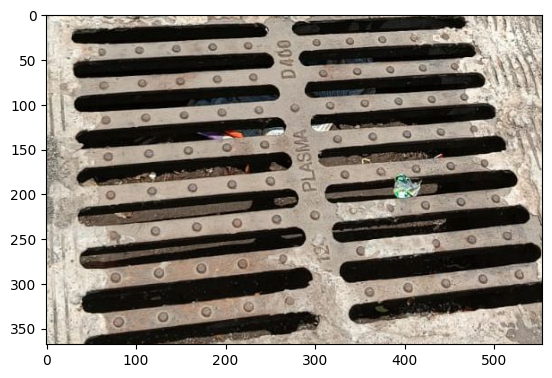

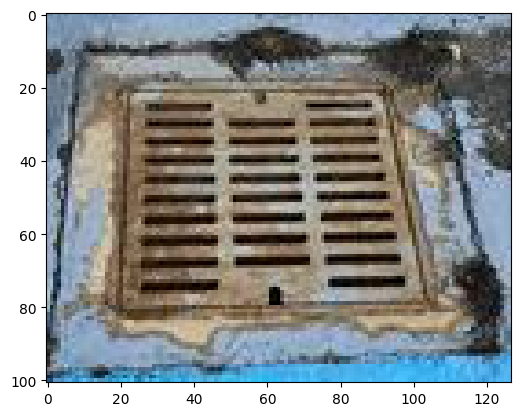

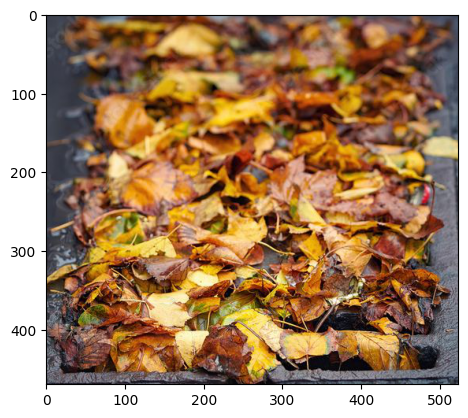

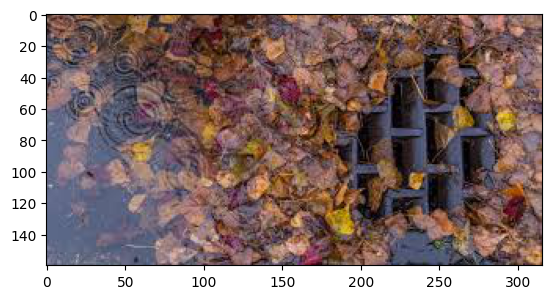

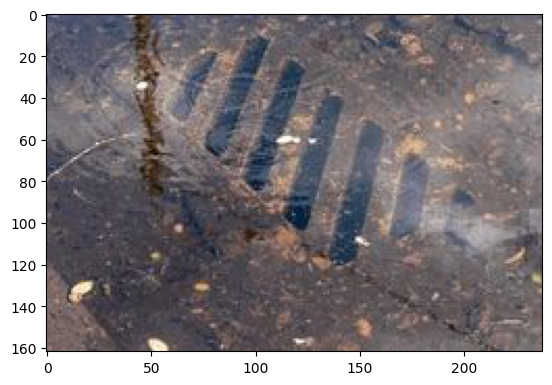

In [15]:
dir_path = r"C:\Users\ADIL SHAIKH\OneDrive\Desktop\BLOCKAGE\basedata\testing\BLOCKAGE"  

for i in os.listdir(dir_path ):
    img = image.load_img(dir_path+"//"+ i)
    plt.imshow(img)
    plt.show()

# LETS PREDICT THE MODEL

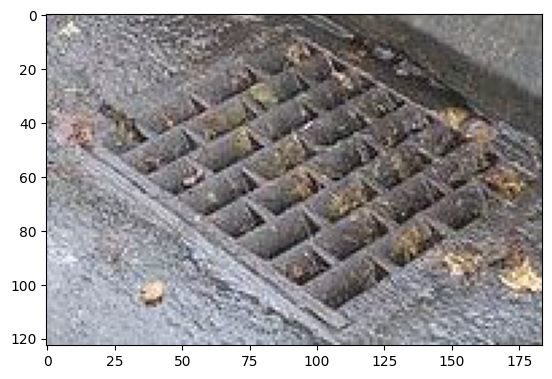

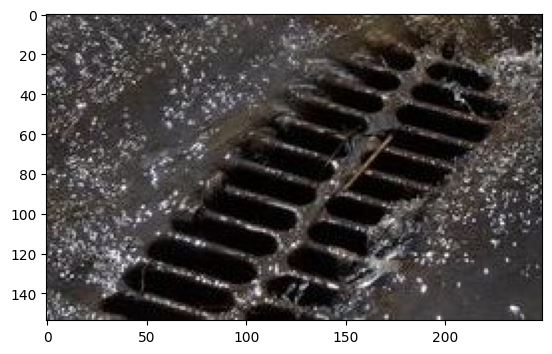

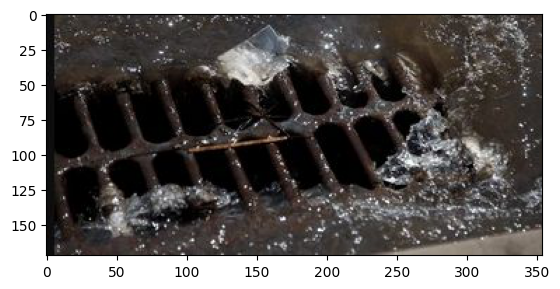

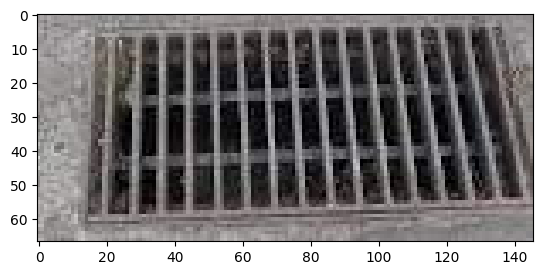

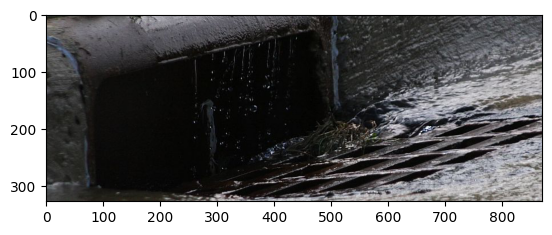

...

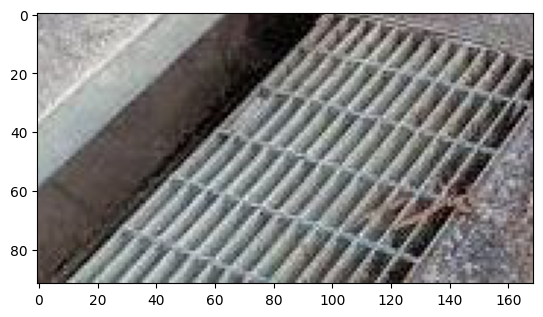

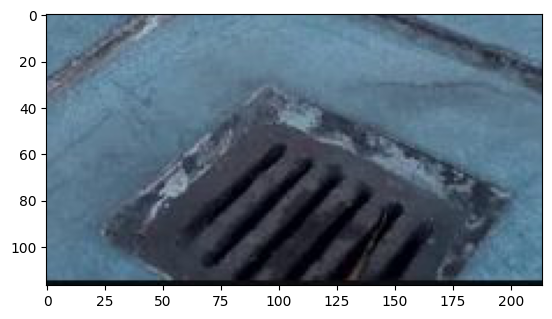

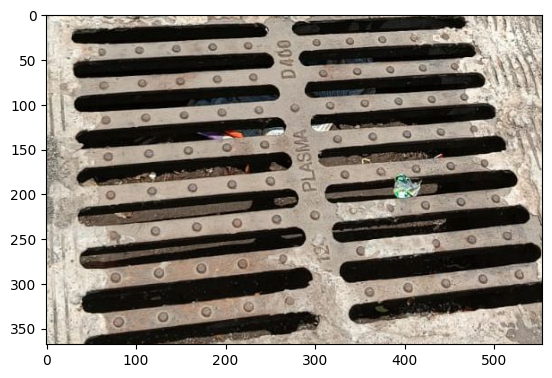

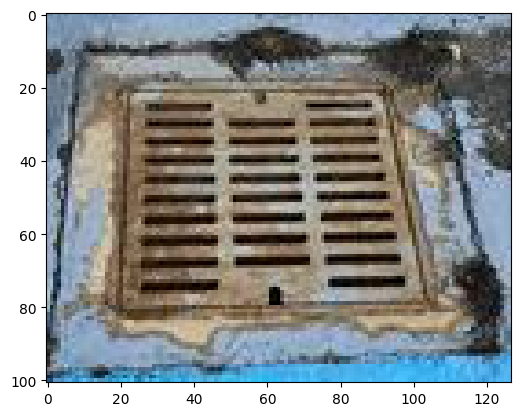

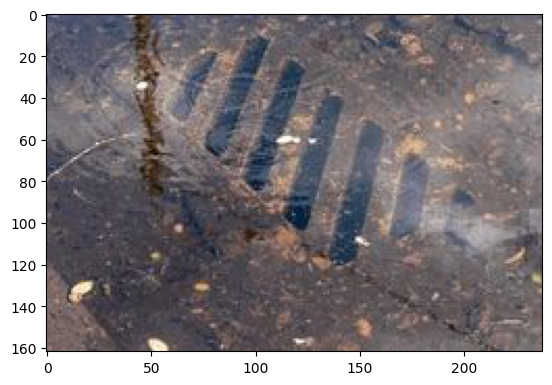

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step
image: Prediction: = NO BLOCKAGE


In [16]:
dir_path = r"C:\Users\ADIL SHAIKH\OneDrive\Desktop\BLOCKAGE\basedata\testing\NO BLOCKAGE"
for i in os.listdir(dir_path ):
    img = image.load_img(dir_path+"//"+ i)
    plt.imshow(img)
    plt.show()

predictions = model.predict(np.expand_dims(img,axis=0))
threshold = 0.5
binary_predictions = (predictions <= threshold).astype(int)

if binary_predictions.any() == 1:
    print("image:","Prediction: = NO BLOCKAGE")
else:
    print("image:","Prediction: = FULL BLOCKAGE")

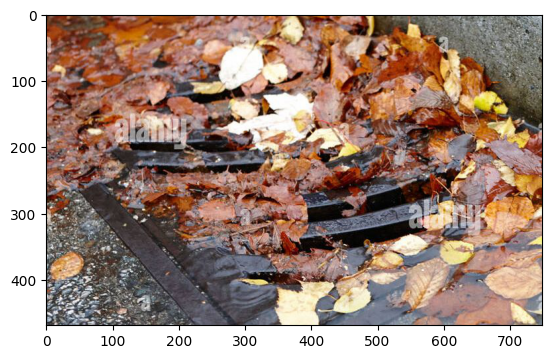

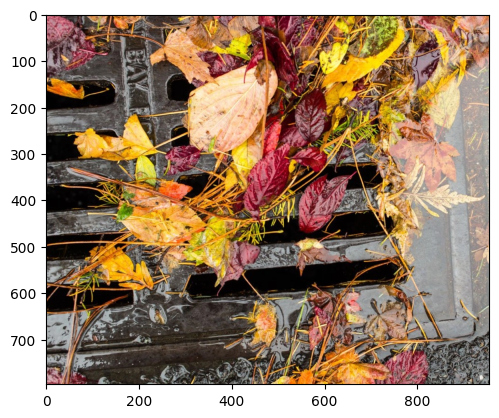

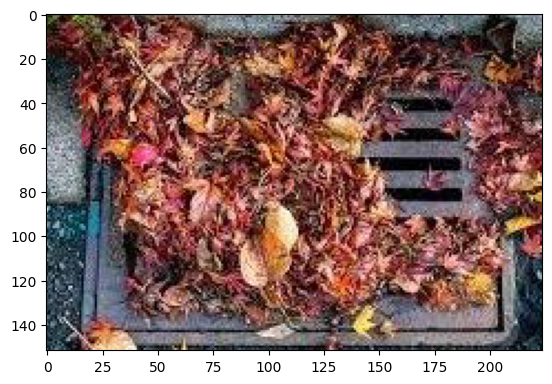

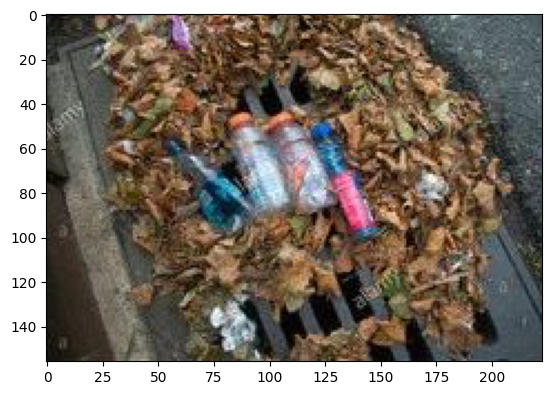

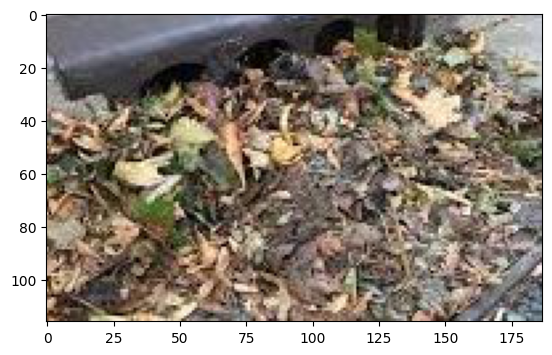

...

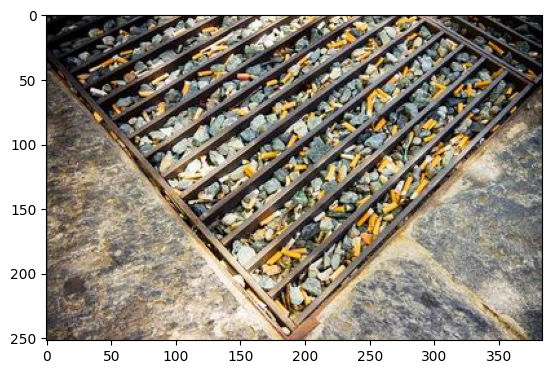

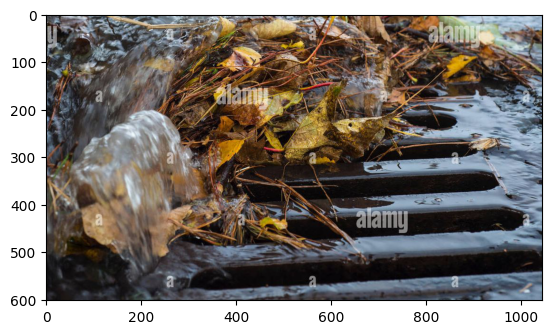

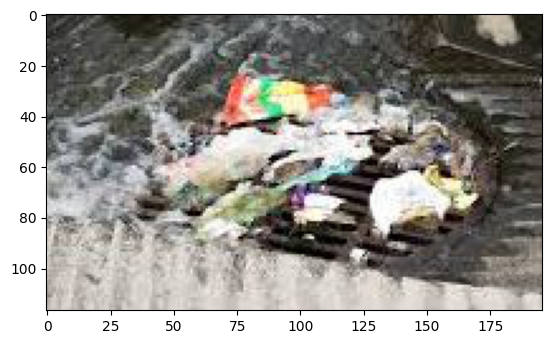

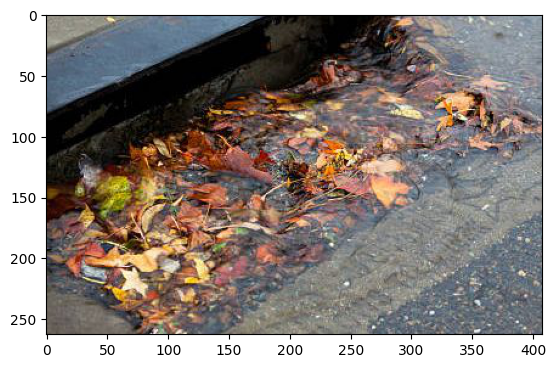

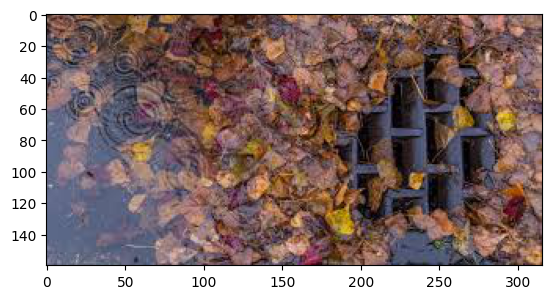

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
image: Prediction: = FULL BLOCKAGE


In [17]:
dir_path = r"C:\Users\ADIL SHAIKH\OneDrive\Desktop\BLOCKAGE\basedata\testing\FULL BLOCKAGE"
for i in os.listdir(dir_path ):
    img = image.load_img(dir_path+"//"+ i)
    plt.imshow(img)
    plt.show()

predictions = model.predict(np.expand_dims(img,axis=0))
threshold = 0.5
binary_predictions = (predictions <= threshold).astype(int)

if binary_predictions.any() == 0:
    print("image:","Prediction: = NO BLOCKAGE")
else:
    print("image:","Prediction: = FULL BLOCKAGE")


In [18]:
images = [r"C:\Users\ADIL SHAIKH\Downloads\Train\1.jpg"]

labels = ["FULL BLOCKAGE"]


#display actual labels
for i in range(len(images)):
    actual_label = labels[i]

In [19]:
# Define the main label "blockage" and subcategories "full blockage" and "no blockage"
label_blockage = "blockage"

label_full_blockage = "full blockage"

label_no_blockage = "no blockage"

# Assuming you have a list of mixed labels within the "blockage" category
mixed_labels = ["full blockage", "no blockage", "full blockage", "no blockage"]  # Example mixed labels

# Convert mixed labels to numerical form based on subcategories
ground_truth = [1 if label == label_no_blockage else 0 if label == label_full_blockage else -1 for label in mixed_labels]

print("Ground Truth Labels in Numerical Form:")
print(ground_truth)


Ground Truth Labels in Numerical Form:
[0, 1, 0, 1]


In [20]:
# Define the directories for your image data
train_data_dir = r"C:\Users\ADIL SHAIKH\OneDrive\Desktop\BLOCKAGE\basedata\training"
test_data_dir =  r"C:\Users\ADIL SHAIKH\OneDrive\Desktop\BLOCKAGE\basedata\validation"

# Set up ImageDataGenerator for data augmentation and normalization
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Flow training images in batches of 32 using train_datagen generator
train_generator = train_datagen.flow_from_directory(
        train_data_dir,
        target_size=(469, 749),
        batch_size=32,
        class_mode='binary')

# Flow validation images in batches of 32 using test_datagen generator
test_generator = test_datagen.flow_from_directory(
        test_data_dir,
        target_size=(469, 749),
        batch_size=32,
        class_mode='binary')

# Define your CNN model
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(16, (3, 3), activation='relu', input_shape=(469, 749, 3)),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(train_generator, validation_data=test_generator)

Found 23 images belonging to 2 classes.
Found 23 images belonging to 2 classes.


C:\Users\ADIL SHAIKH\Anaconda3\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 85s 85s/step - accuracy: 0.3913 - loss: 0.6965 - val_accuracy: 0.5652 - val_loss: 32.9500


In [21]:
# Make predictions on new images
predictions = model.predict(test_generator)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


In [22]:
TP = sum([1 for i in range(len(ground_truth)) if ground_truth[i] == 1 and predictions[i] == 1])
FP = sum([1 for i in range(len(ground_truth)) if ground_truth[i] == 0 and predictions[i] == 0])
FN = sum([1 for i in range(len(ground_truth)) if ground_truth[i] == 0 and predictions[i] == 0])

# Calculate Precision
precision = TP / (TP + FP)

# Calculate Recall
recall = TP / (TP + FN)

# Calculate F1 Score
f1_score = 2 * (precision * recall) / (precision + recall)

print("True Positives:", TP)
print("False Positives:", FP)
print("False Negatives:", FN)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1_score)

True Positives: 2
False Positives: 0
False Negatives: 0
Precision: 1.0
Recall: 1.0
F1 Score: 1.0


# model shows accuracy of 100%